<a href="https://colab.research.google.com/github/BMugo84/pytorch_in_25_hours/blob/main/FinanceBill0203Visualization_DIRTY.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# visualizing kenyan constituencies based on who voted for the 2022-2023 finance bill

In [ ]:
import geopandas as gdp
import folium
import numpy as np
import pandas as pd


In [ ]:
%load_ext google.colab.data_table

In [ ]:
%unload_ext google.colab.data_table

In [ ]:
# investigate data in the geospacial file using geopandas
constituencies_json = gdp.read_file('/content/_Kenya+Constituencies_kenya_constituencies.geojson')
constituencies_json

,OBJECTID,COUNTY_NAM,CONST_CODE,CONSTITUEN,COUNTY_ASS,COUNTY_A_1,REGIST_CEN,REGISTRATI,COUNTY_COD,Shape_Leng,Shape_Area,geometry
0,1,NAIROBI,288.0,KAMUKUNJI,0.0,None,0.0,None,47.0,0.164632,0.000978,"MULTIPOLYGON (((36.87595 -1.26253, 36.87894 -1..."
1,2,NAIROBI,274.0,WESTLANDS,0.0,None,0.0,None,47.0,0.412418,0.005909,"MULTIPOLYGON (((36.81926 -1.20643, 36.83463 -1..."
2,3,NAIROBI,275.0,DAGORETTI NORTH,0.0,None,0.0,None,47.0,0.232409,0.002385,"MULTIPOLYGON (((36.79214 -1.26085, 36.79290 -1..."
3,4,NAIROBI,279.0,ROYSAMBU,0.0,None,0.0,None,47.0,0.384357,0.003908,"MULTIPOLYGON (((36.90578 -1.16138, 36.90731 -1..."
4,5,NAIROBI,289.0,STAREHE,0.0,None,0.0,None,47.0,0.206915,0.001325,"MULTIPOLYGON (((36.84275 -1.26460, 36.84375 -1..."
...,...,...,...,...,...,...,...,...,...,...,...,...
290,334,None,0.0,None,0.0,None,0.0,None,0.0,0.010436,0.000005,"MULTIPOLYGON (((34.75454 -0.03184, 34.75412 -0..."
291,341,None,0.0,None,0.0,None,0.0,None,0.0,0.026186,0.000016,"MULTIPOLYGON (((34.77883 -0.12278, 34.77511 -0..."
292,342,None,0.0,None,0.0,None,0.0,None,0.0,0.032459,0.000021,"MULTIPOLYGON (((34.77871 -0.12285, 34.77212 -0..."
293,348,None,0.0,None,0.0,None,0.0,None,0.0,0.017963,0.000011,"MULTIPOLYGON (((34.78616 -0.11375, 34.78592 -0..."


In [ ]:
# display only the constituencies column

constituencies_json['CONSTITUEN']

0            KAMUKUNJI
1            WESTLANDS
2      DAGORETTI NORTH
3             ROYSAMBU
4              STAREHE
            ...       
290               None
291               None
292               None
293               None
294               None
Name: CONSTITUEN, Length: 295, dtype: object

In [ ]:
# number of rows on the json file
len(constituencies_json)

295

In [ ]:
# list the columns in the json file
constituencies_json.columns


Index(['OBJECTID', 'COUNTY_NAM', 'CONST_CODE', 'CONSTITUEN', 'COUNTY_ASS',
       'COUNTY_A_1', 'REGIST_CEN', 'REGISTRATI', 'COUNTY_COD', 'Shape_Leng',
       'Shape_Area', 'geometry'],
      dtype='object')

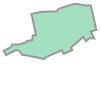

In [ ]:
# view the geometry of the first constituency
constituencies_json.geometry[0]

In [ ]:
# store 'CONSTITUEN' in a variable
constituencies = constituencies_json['CONSTITUEN']
print(constituencies)

0            KAMUKUNJI
1            WESTLANDS
2      DAGORETTI NORTH
3             ROYSAMBU
4              STAREHE
            ...       
290               None
291               None
292               None
293               None
294               None
Name: CONSTITUEN, Length: 295, dtype: object


In [ ]:
# draw map
kenya_geo = '/content/_Kenya+Constituencies_kenya_constituencies.geojson'
kenya_map = folium.Map(location=[0, 0], zoom_start=2)
folium.GeoJson(kenya_geo).add_to(kenya_map)
kenya_map


In [ ]:
# read the finance bill vote into a dataframe
df_vote = pd.read_csv('/content/mps_cleaned.csv')
df_vote

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
0,Basil Robert Ngui,YATTA,WIPER,NO
1,Mwakuwona Danson Mwashako,WUNDANYI,WIPER,NO
2,Wetangula Timothy Wanyonyi,WESTLANDS,ODM,NO
3,Sergon Flowrence Jematiah,BARINGO COUNTY,UDA,YES
4,Mogaka Stephen M.,WEST MUGIRANGO,JUBILEE,YES
...,...,...,...,...
343,Owino John Walter,AWENDO,ODM,ABSENT
344,Samuel Onunga Atan Meli,ALEGO USONGA,ODM,NO
345,Kitany Marianne Jebet,ALDAI,UDA,YES
346,Langat Benjamin Kipkirui,AINAMOI,UDA,YES


we have 290 constituencies in our geojson map and 348 constituencies in the finance bill vote dataframe.
we wil have to purge some rows in order for them to match up.
we will purge, from the finance bill vote dataframe, 47 women reps and 12 nominated mps.

In [ ]:
df_vote.head()

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
0,Basil Robert Ngui,YATTA,WIPER,NO
1,Mwakuwona Danson Mwashako,WUNDANYI,WIPER,NO
2,Wetangula Timothy Wanyonyi,WESTLANDS,ODM,NO
3,Sergon Flowrence Jematiah,BARINGO COUNTY,UDA,YES
4,Mogaka Stephen M.,WEST MUGIRANGO,JUBILEE,YES


In [ ]:
# replace county names with county name + county
# df_vote['CONSTITUENCY'] = df_vote['CONSTITUENCY'].str.replace('GARISSA', 'GARISSA COUNTY')
# df_vote['CONSTITUENCY'] = df_vote['CONSTITUENCY'].str.replace('GARISSA COUNTY TOWNSHIP', 'GARISSA TOWNSHIP')
# df_vote['CONSTITUENCY'] = df_vote['CONSTITUENCY'].str.replace('ELGEYO MARAKWET', 'ELGEYO MARAKWET COUNTY')
# df_vote['CONSTITUENCY'] = df_vote['CONSTITUENCY'].str.replace('TAITA TAVETA', 'TAITA TAVETA COUNTY')
# df_vote['CONSTITUENCY'] = df_vote['CONSTITUENCY'].str.replace('UASIN GISHU', 'UASIN GISHU COUNTY')
# df_vote['CONSTITUENCY'] = df_vote['CONSTITUENCY'].str.replace('MOMBASA', 'MOMBASA COUNTY')
df_vote['CONSTITUENCY'] = df_vote['CONSTITUENCY'].str.replace('TRANS NZOIA', 'TRANS NZOIA COUNTY')

df_vote

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
0,Basil Robert Ngui,YATTA,WIPER,NO
1,Mwakuwona Danson Mwashako,WUNDANYI,WIPER,NO
2,Wetangula Timothy Wanyonyi,WESTLANDS,ODM,NO
3,Sergon Flowrence Jematiah,BARINGO COUNTY,UDA,YES
4,Mogaka Stephen M.,WEST MUGIRANGO,JUBILEE,YES
...,...,...,...,...
343,Owino John Walter,AWENDO,ODM,ABSENT
344,Samuel Onunga Atan Meli,ALEGO USONGA,ODM,NO
345,Kitany Marianne Jebet,ALDAI,UDA,YES
346,Langat Benjamin Kipkirui,AINAMOI,UDA,YES


In [ ]:
df_vote

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
0,Basil Robert Ngui,YATTA,WIPER,NO
1,Mwakuwona Danson Mwashako,WUNDANYI,WIPER,NO
2,Wetangula Timothy Wanyonyi,WESTLANDS,ODM,NO
3,Sergon Flowrence Jematiah,BARINGO COUNTY,UDA,YES
4,Mogaka Stephen M.,WEST MUGIRANGO,JUBILEE,YES
...,...,...,...,...
343,Owino John Walter,AWENDO,ODM,ABSENT
344,Samuel Onunga Atan Meli,ALEGO USONGA,ODM,NO
345,Kitany Marianne Jebet,ALDAI,UDA,YES
346,Langat Benjamin Kipkirui,AINAMOI,UDA,YES


In [ ]:
# identify rows containing "COUNTY" in our df_vote dataframe
women_reps_county_rows = df_vote['CONSTITUENCY'].str.contains("COUNTY")
# view list of rows where county is True
women_reps_county_rows


0      False
1      False
2      False
3       True
4      False
       ...  
343    False
344    False
345    False
346    False
347    False
Name: CONSTITUENCY, Length: 348, dtype: bool

In [ ]:
# create a dataframe with rows containing COUNTY
women_reps_df = df_vote[women_reps_county_rows]
women_reps_df

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
3,Sergon Flowrence Jematiah,BARINGO COUNTY,UDA,YES
11,Chepkorir Linet Toto,BOMET COUNTY,UDA,YES
13,Wambilianga Catherine Nanjala,BUNGOMA COUNTY,FORDK,ABSENT
23,Omanyo Catherine Nakhabi,BUSIA COUNTY,ODM,SUSPENDED
26,Siyoi Lillian Chebet,TRANS NZOIA COUNTY,UDA,YES
33,Double N Pamela Njoki Njeru,EMBU COUNTY,UDA,ABSENT
40,Osogo Bensuda Joyce Atieno,HOMA BAY COUNTY,ODM,ABSENT
55,Bonaya Mumina Gollo,ISIOLO COUNTY,JUBILEE,ABSENT
61,Sankaire Leah Sopiato,KAJIADO COUNTY,UDA,YES
79,Muhanda Elsie Busihile,KAKAMEGA COUNTY,ODM,NO


In [ ]:
# create a dataframe without rows containing COUNTY
df_vote_no_women_reps = df_vote[~women_reps_county_rows]
df_vote_no_women_reps

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
0,Basil Robert Ngui,YATTA,WIPER,NO
1,Mwakuwona Danson Mwashako,WUNDANYI,WIPER,NO
2,Wetangula Timothy Wanyonyi,WESTLANDS,ODM,NO
4,Mogaka Stephen M.,WEST MUGIRANGO,JUBILEE,YES
5,Sitati Daniel Wanyama,WEBUYE WEST,UDA,YES
...,...,...,...,...
343,Owino John Walter,AWENDO,ODM,ABSENT
344,Samuel Onunga Atan Meli,ALEGO USONGA,ODM,NO
345,Kitany Marianne Jebet,ALDAI,UDA,YES
346,Langat Benjamin Kipkirui,AINAMOI,UDA,YES


In [ ]:
# identify rows where mp is nominated
nominated_mps_rows = df_vote_no_women_reps['CONSTITUENCY'].str.contains("NOMINATED")
nominated_mps_rows

0      False
1      False
2      False
4      False
5      False
       ...  
343    False
344    False
345    False
346    False
347    False
Name: CONSTITUENCY, Length: 306, dtype: bool

In [ ]:
# create a dataframe for nominated mps
nominated_mps_df = df_vote_no_women_reps[nominated_mps_rows]
nominated_mps_df

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
164,Mayaka Irene Nyakerario,NOMINATED,ODM,ABSENT
167,Mohamed Umulkher Harun,NOMINATED,ODM,ABSENT
168,Ng'ongo John Mbadi,NOMINATED,ODM,ABSENT
172,Chege Sabina,NOMINATED,JUBILEE,SUSPENDED
186,Ali Abdisirat Khalif,NOMINATED,UDA,YES
191,Ikiara Dorothy Muthoni,NOMINATED,UDA,YES
195,Iraya Joseph Wainaina,NOMINATED,UDA,YES
208,Kosgei Jackson Kipkemoi,NOMINATED,UDA,YES
212,Mwangi Teresia Wanjiru,NOMINATED,UDA,YES
214,Harun Suleka Hulbale,NOMINATED,UDM,YES


In [ ]:
# create a dataframe for rows without nominated mps
df_vote_no_nominated_mps = df_vote_no_women_reps[~nominated_mps_rows]
df_vote_no_nominated_mps

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
0,Basil Robert Ngui,YATTA,WIPER,NO
1,Mwakuwona Danson Mwashako,WUNDANYI,WIPER,NO
2,Wetangula Timothy Wanyonyi,WESTLANDS,ODM,NO
4,Mogaka Stephen M.,WEST MUGIRANGO,JUBILEE,YES
5,Sitati Daniel Wanyama,WEBUYE WEST,UDA,YES
...,...,...,...,...
343,Owino John Walter,AWENDO,ODM,ABSENT
344,Samuel Onunga Atan Meli,ALEGO USONGA,ODM,NO
345,Kitany Marianne Jebet,ALDAI,UDA,YES
346,Langat Benjamin Kipkirui,AINAMOI,UDA,YES


In [ ]:
# reassign variables
df_constituencies_vote = df_vote_no_nominated_mps
df_nominated = nominated_mps_df
df_women_reps = women_reps_df
constituencies_json = constituencies_json

In [ ]:
df_constituencies_vote.head()

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
0,Basil Robert Ngui,YATTA,WIPER,NO
1,Mwakuwona Danson Mwashako,WUNDANYI,WIPER,NO
2,Wetangula Timothy Wanyonyi,WESTLANDS,ODM,NO
4,Mogaka Stephen M.,WEST MUGIRANGO,JUBILEE,YES
5,Sitati Daniel Wanyama,WEBUYE WEST,UDA,YES


In [ ]:
constituencies_json.head()

,OBJECTID,COUNTY_NAM,CONST_CODE,CONSTITUEN,COUNTY_ASS,COUNTY_A_1,REGIST_CEN,REGISTRATI,COUNTY_COD,Shape_Leng,Shape_Area,geometry
0,1,NAIROBI,288.0,KAMUKUNJI,0.0,None,0.0,None,47.0,0.164632,0.000978,"MULTIPOLYGON (((36.87595 -1.26253, 36.87894 -1..."
1,2,NAIROBI,274.0,WESTLANDS,0.0,None,0.0,None,47.0,0.412418,0.005909,"MULTIPOLYGON (((36.81926 -1.20643, 36.83463 -1..."
2,3,NAIROBI,275.0,DAGORETTI NORTH,0.0,None,0.0,None,47.0,0.232409,0.002385,"MULTIPOLYGON (((36.79214 -1.26085, 36.79290 -1..."
3,4,NAIROBI,279.0,ROYSAMBU,0.0,None,0.0,None,47.0,0.384357,0.003908,"MULTIPOLYGON (((36.90578 -1.16138, 36.90731 -1..."
4,5,NAIROBI,289.0,STAREHE,0.0,None,0.0,None,47.0,0.206915,0.001325,"MULTIPOLYGON (((36.84275 -1.26460, 36.84375 -1..."


In [ ]:
# check to see which constituencies dont match up
mismatch = df_constituencies_vote[~df_constituencies_vote['CONSTITUENCY'].isin(constituencies_json['CONSTITUEN'])]
mismatch

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
0,Basil Robert Ngui,YATTA,WIPER,NO
1,Mwakuwona Danson Mwashako,WUNDANYI,WIPER,NO
2,Wetangula Timothy Wanyonyi,WESTLANDS,ODM,NO
4,Mogaka Stephen M.,WEST MUGIRANGO,JUBILEE,YES
5,Sitati Daniel Wanyama,WEBUYE WEST,UDA,YES
...,...,...,...,...
343,Owino John Walter,AWENDO,ODM,ABSENT
344,Samuel Onunga Atan Meli,ALEGO USONGA,ODM,NO
345,Kitany Marianne Jebet,ALDAI,UDA,YES
346,Langat Benjamin Kipkirui,AINAMOI,UDA,YES


In [ ]:
sorted_df_constituencies_vote = df_constituencies_vote.sort_values(by='CONSTITUENCY')
sorted_df_constituencies_vote

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
347,Chepkonga Kiprono Samwel,AINABKOI,UDA,YES
346,Langat Benjamin Kipkirui,AINAMOI,UDA,YES
345,Kitany Marianne Jebet,ALDAI,UDA,YES
344,Samuel Onunga Atan Meli,ALEGO USONGA,ODM,NO
343,Owino John Walter,AWENDO,ODM,ABSENT
...,...,...,...,...
5,Sitati Daniel Wanyama,WEBUYE WEST,UDA,YES
4,Mogaka Stephen M.,WEST MUGIRANGO,JUBILEE,YES
2,Wetangula Timothy Wanyonyi,WESTLANDS,ODM,NO
1,Mwakuwona Danson Mwashako,WUNDANYI,WIPER,NO


In [ ]:
sorted_constituencies_json = constituencies_json.sort_values(by='CONSTITUEN')
sorted_constituencies_json

,OBJECTID,COUNTY_NAM,CONST_CODE,CONSTITUEN,COUNTY_ASS,COUNTY_A_1,REGIST_CEN,REGISTRATI,COUNTY_COD,Shape_Leng,Shape_Area,geometry
133,134,UASIN GISHU,144.0,AINABKOI,0.0,None,0.0,None,27.0,1.690422,0.042099,"MULTIPOLYGON (((35.35916 0.51894, 35.36093 0.5..."
187,188,KERICHO,190.0,AINAMOI,0.0,None,0.0,None,35.0,0.904572,0.019913,"MULTIPOLYGON (((35.27302 -0.23839, 35.27615 -0..."
146,147,NANDI,152.0,ALDAI,0.0,None,0.0,None,29.0,1.347239,0.037390,"MULTIPOLYGON (((34.94052 0.07955, 34.94351 0.0..."
225,226,SIAYA,234.0,ALEGO USONGA,0.0,None,0.0,None,41.0,1.071566,0.049331,"MULTIPOLYGON (((34.20633 0.15798, 34.20895 0.1..."
236,237,MIGORI,254.0,AWENDO,0.0,None,0.0,None,44.0,0.750398,0.021322,"MULTIPOLYGON (((34.54635 -0.75053, 34.54794 -0..."
...,...,...,...,...,...,...,...,...,...,...,...,...
290,334,None,0.0,None,0.0,None,0.0,None,0.0,0.010436,0.000005,"MULTIPOLYGON (((34.75454 -0.03184, 34.75412 -0..."
291,341,None,0.0,None,0.0,None,0.0,None,0.0,0.026186,0.000016,"MULTIPOLYGON (((34.77883 -0.12278, 34.77511 -0..."
292,342,None,0.0,None,0.0,None,0.0,None,0.0,0.032459,0.000021,"MULTIPOLYGON (((34.77871 -0.12285, 34.77212 -0..."
293,348,None,0.0,None,0.0,None,0.0,None,0.0,0.017963,0.000011,"MULTIPOLYGON (((34.78616 -0.11375, 34.78592 -0..."


mismatch failed. checking possible reasons

In [ ]:
# column name mismatch
print(df_constituencies_vote.columns)
print(constituencies_json.columns)


Index(['FULL_NAME', 'CONSTITUENCY', 'POLITICAL_PARTY', 'VOTE'], dtype='object')
Index(['OBJECTID', 'COUNTY_NAM', 'CONST_CODE', 'CONSTITUEN', 'COUNTY_ASS',
       'COUNTY_A_1', 'REGIST_CEN', 'REGISTRATI', 'COUNTY_COD', 'Shape_Leng',
       'Shape_Area', 'geometry'],
      dtype='object')


In [ ]:
# datatype mismatch
print(df_constituencies_vote['CONSTITUENCY'].dtype)
print(constituencies_json['CONSTITUEN'].dtype)


object
object


In [ ]:
# whitespace or case sentitivity issues
df_constituencies_vote['CONSTITUENCY'] = df_constituencies_vote['CONSTITUENCY'].str.strip().str.upper()
constituencies_json['CONSTITUEN'] = constituencies_json['CONSTITUEN'].str.strip().str.upper()


<ipython-input-29-4eb99e0f8ea0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_constituencies_vote['CONSTITUENCY'] = df_constituencies_vote['CONSTITUENCY'].str.strip().str.upper()


In [ ]:
# missing values
df_constituencies_vote['CONSTITUENCY'].isna().sum()
constituencies_json['CONSTITUEN'].isna().sum()


5

In [ ]:
# uniqueness
print(len(constituencies_json['CONSTITUEN'].unique()))
print(len(df_constituencies_vote['CONSTITUENCY'].unique()))

291
292


In [ ]:
# check to see which constituencies dont match up
mismatch = df_constituencies_vote[~df_constituencies_vote['CONSTITUENCY'].isin(constituencies_json['CONSTITUEN'])]
mismatch

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
5,Sitati Daniel Wanyama,WEBUYE WEST,UDA,YES
6,Wanyonyi Martin Pepela,WEBUYE WEST,FORDK,YES
14,Kivai Ernest Ogesi,VIHHIGA,ANC,YES
18,Shollei Gladys Jepkosgei Boss,UASIN GISHU,UDA,ABSENT
41,Mizighi Lydia Haika Mnene,TAITA TAVETA,UDA,YES
45,Omondi Caroli,SUBA SOUTH,ODM,YES
46,Odhiambo Millie Grace Akoth,SUBA NORTH,ODM,SUSPENDED
119,Kihara Jayne Wanjiru Njeru,NAIVASH,UDA,YES
133,Chesebe Fred Kapondi,MT ELGON,UDA,YES
137,Chimba Zamzam Mohamed,MOMBASA,ODM,NO


In [ ]:
# check to see which constituencies dont match up
mismatch = constituencies_json[~constituencies_json['CONSTITUEN'].isin(df_constituencies_vote['CONSTITUENCY'])]
mismatch

,OBJECTID,COUNTY_NAM,CONST_CODE,CONSTITUEN,COUNTY_ASS,COUNTY_A_1,REGIST_CEN,REGISTRATI,COUNTY_COD,Shape_Leng,Shape_Area,geometry
51,52,MANDERA,40.0,BANISSA,0.0,None,0.0,None,9.0,2.808101,0.275420,"MULTIPOLYGON (((40.77175 4.27773, 40.77554 4.2..."
56,57,ISIOLO,49.0,ISIOLO NORTH,0.0,None,0.0,None,11.0,9.047598,1.244861,"MULTIPOLYGON (((38.08071 0.78078, 38.07656 0.7..."
65,66,MERU,58.0,CENTRAL IMENTI,0.0,None,0.0,None,12.0,1.517072,0.040949,"MULTIPOLYGON (((37.60293 0.02974, 37.60476 0.0..."
160,161,NAKURU,168.0,NAIVASHA,0.0,None,0.0,None,32.0,2.188846,0.139802,"MULTIPOLYGON (((36.53372 -0.67613, 36.54477 -0..."
202,203,VIHIGA,211.0,VIHIGA,0.0,None,0.0,None,38.0,0.413201,0.007206,"MULTIPOLYGON (((34.67532 0.08376, 34.68454 0.0..."
205,206,BUNGOMA,216.0,MT. ELGON,0.0,None,0.0,None,39.0,1.430211,0.078133,"MULTIPOLYGON (((34.62033 1.10018, 34.62411 1.0..."
210,211,BUNGOMA,221.0,WEBUYE EAST,0.0,None,0.0,None,39.0,0.652363,0.013454,"MULTIPOLYGON (((34.80496 0.75866, 34.80496 0.7..."
212,213,BUNGOMA,222.0,WEBUTE WEST,0.0,None,0.0,None,39.0,0.920114,0.018970,"MULTIPOLYGON (((34.72793 0.71974, 34.73031 0.7..."
228,229,HOMA BAY,252.0,SUBA,0.0,None,0.0,None,43.0,1.250979,0.095226,"MULTIPOLYGON (((34.24234 -0.54515, 34.24954 -0..."
231,232,HOMA BAY,251.0,MBITA,0.0,None,0.0,None,43.0,1.653491,0.085359,"MULTIPOLYGON (((34.29135 -0.43052, 34.29452 -0..."


In [ ]:
# Dictionary of incorrect to correct constituency names
replace_dict = {
    # 'WEBUYE WEST': 'WEBUYE EAST',
    'VIHHIGA': 'VIHIGA',
    'ISOLO NORTH': 'ISIOLO NORTH',
    'IMENTI CENTRAL': 'CENTRAL IMENTI',
    'MT ELGON': 'MT. ELGON',
    'NAIVASH': 'NAIVASHA',
    'SUBA_SOUTH': 'SUBA'
}
# Clean and prepare data
df_constituencies_vote['CONSTITUENCY'] = df_constituencies_vote['CONSTITUENCY'].replace(replace_dict)

<ipython-input-34-dece4c166d4b>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_constituencies_vote['CONSTITUENCY'] = df_constituencies_vote['CONSTITUENCY'].replace(replace_dict)


In [ ]:
# check to see which constituencies dont match up
mismatch = constituencies_json[~constituencies_json['CONSTITUEN'].isin(df_constituencies_vote['CONSTITUENCY'])]
mismatch

,OBJECTID,COUNTY_NAM,CONST_CODE,CONSTITUEN,COUNTY_ASS,COUNTY_A_1,REGIST_CEN,REGISTRATI,COUNTY_COD,Shape_Leng,Shape_Area,geometry
51,52,MANDERA,40.0,BANISSA,0.0,None,0.0,None,9.0,2.808101,0.275420,"MULTIPOLYGON (((40.77175 4.27773, 40.77554 4.2..."
210,211,BUNGOMA,221.0,WEBUYE EAST,0.0,None,0.0,None,39.0,0.652363,0.013454,"MULTIPOLYGON (((34.80496 0.75866, 34.80496 0.7..."
212,213,BUNGOMA,222.0,WEBUTE WEST,0.0,None,0.0,None,39.0,0.920114,0.018970,"MULTIPOLYGON (((34.72793 0.71974, 34.73031 0.7..."
228,229,HOMA BAY,252.0,SUBA,0.0,None,0.0,None,43.0,1.250979,0.095226,"MULTIPOLYGON (((34.24234 -0.54515, 34.24954 -0..."
231,232,HOMA BAY,251.0,MBITA,0.0,None,0.0,None,43.0,1.653491,0.085359,"MULTIPOLYGON (((34.29135 -0.43052, 34.29452 -0..."
244,245,KISII,264.0,BOBASI,0.0,None,0.0,None,45.0,0.679333,0.019470,"MULTIPOLYGON (((34.74655 -0.71226, 34.74734 -0..."
290,334,None,0.0,None,0.0,None,0.0,None,0.0,0.010436,0.000005,"MULTIPOLYGON (((34.75454 -0.03184, 34.75412 -0..."
291,341,None,0.0,None,0.0,None,0.0,None,0.0,0.026186,0.000016,"MULTIPOLYGON (((34.77883 -0.12278, 34.77511 -0..."
292,342,None,0.0,None,0.0,None,0.0,None,0.0,0.032459,0.000021,"MULTIPOLYGON (((34.77871 -0.12285, 34.77212 -0..."
293,348,None,0.0,None,0.0,None,0.0,None,0.0,0.017963,0.000011,"MULTIPOLYGON (((34.78616 -0.11375, 34.78592 -0..."


In [ ]:
# check to see which constituencies dont match up
mismatch = df_constituencies_vote[~df_constituencies_vote['CONSTITUENCY'].isin(constituencies_json['CONSTITUEN'])]
mismatch

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
5,Sitati Daniel Wanyama,WEBUYE WEST,UDA,YES
6,Wanyonyi Martin Pepela,WEBUYE WEST,FORDK,YES
18,Shollei Gladys Jepkosgei Boss,UASIN GISHU,UDA,ABSENT
41,Mizighi Lydia Haika Mnene,TAITA TAVETA,UDA,YES
45,Omondi Caroli,SUBA SOUTH,ODM,YES
46,Odhiambo Millie Grace Akoth,SUBA NORTH,ODM,SUSPENDED
137,Chimba Zamzam Mohamed,MOMBASA,ODM,NO
292,Siyad Amina Udgoon,GARISSA,JUBILEE,ABSENT
307,Caroline Jeptoo Ng'elechei,ELGEYO MARAKWET,IND,YES


In [ ]:
df_constituencies_vote.loc[6, 'CONSTITUENCY'] = 'WEBUYE EAST'

In [ ]:
df_constituencies_vote.loc[45, 'CONSTITUENCY'] = 'SUBA'

In [ ]:
constituencies_json.loc[212, 'CONSTITUEN'] = 'WEBUYE WEST'

In [ ]:
# Find row(s) where constituency is 'CHESUMEI'
chesumei_rows = df_constituencies_vote[df_constituencies_vote['CONSTITUENCY'] == 'CHESUMEI']
chesumei_rows

,FULL_NAME,CONSTITUENCY,POLITICAL_PARTY,VOTE
314,Biego Paul Kibichy,CHESUMEI,YES,UDA


In [ ]:
df_constituencies_vote.loc[314, 'POLITICAL_PARTY'] = 'UDA'
df_constituencies_vote.loc[314, 'VOTE'] = 'YES'

In [ ]:
# removing trrailing whitespaces
df_constituencies_vote['VOTE'] = df_constituencies_vote['VOTE'].str.strip()




<ipython-input-42-dc0e073c942c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_constituencies_vote['VOTE'] = df_constituencies_vote['VOTE'].str.strip()


missing 2 constituencies from the finance bill vote dataframe   

In [ ]:
df_constituencies_vote['VOTE'].unique()

array(['NO', 'YES', 'ABSENT', 'SUSPENDED'], dtype=object)

plot

In [ ]:
df_constituencies_vote.columns

Index(['FULL_NAME', 'CONSTITUENCY', 'POLITICAL_PARTY', 'VOTE'], dtype='object')

In [ ]:
constituencies_json.columns

Index(['OBJECTID', 'COUNTY_NAM', 'CONST_CODE', 'CONSTITUEN', 'COUNTY_ASS',
       'COUNTY_A_1', 'REGIST_CEN', 'REGISTRATI', 'COUNTY_COD', 'Shape_Leng',
       'Shape_Area', 'geometry'],
      dtype='object')

In [ ]:
import folium
import geopandas as gpd
import pandas as pd

# Center coordinates for the map
centre = (-1.2921, 36.8219)
kenya_map = folium.Map(location=centre, zoom_start=6.2)

# Assuming df_constituencies_vote is your DataFrame with the vote data
# Merge the DataFrame with the GeoDataFrame on the appropriate column
merged_df = constituencies_json.merge(df_constituencies_vote, left_on='CONSTITUEN', right_on='CONSTITUENCY')

# Define the color mapping
color_mapping = {
    'NO': 'red',
    'YES': 'green',
    'ABSENT': 'blue',  # Updated to blue to avoid conflict with green used for 'YES'
    'SUSPENDED': 'orange'
}

# Function to apply the color mapping
def get_color(feature):
    vote = feature['properties']['VOTE']
    return color_mapping.get(vote, 'gray')  # Default to gray if not found

# Add GeoJson layer to the map with color mapping
folium.GeoJson(
    merged_df,
    style_function=lambda feature: {
        'fillColor': get_color(feature),
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.6,
    },
    tooltip=folium.GeoJsonTooltip(fields=['CONSTITUEN', 'VOTE'], aliases=['Constituency', 'Vote'])
).add_to(kenya_map)

# Add a legend to the map
legend_html = '''
<div style="position: fixed;
     bottom: 50px; left: 50px; width: 200px; height: 150px;
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white;">
     &nbsp;<b>Vote Legend</b><br>
     &nbsp;<i style="background: red"></i>&nbsp;NO<br>
     &nbsp;<i style="background: green"></i>&nbsp;YES<br>
     &nbsp;<i style="background: blue"></i>&nbsp;ABSENT<br>
     &nbsp;<i style="background: orange"></i>&nbsp;SUSPENDED<br>
</div>
'''

kenya_map.get_root().html.add_child(folium.Element(legend_html))

# Display the map
kenya_map


In [ ]:
import folium
import geopandas as gpd
import pandas as pd

# Center coordinates for the map
centre = (-1.2921, 36.8219)
no_map = folium.Map(location=centre, zoom_start=6.2)

# Filter GeoDataFrame for 'NO' votes
no_df = merged_df[merged_df['VOTE'] == 'NO']

# Add GeoJson layer to the map
folium.GeoJson(
    no_df,
    style_function=lambda feature: {
        'fillColor': 'red',
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.6,
    },
    tooltip=folium.GeoJsonTooltip(fields=['CONSTITUEN', 'VOTE'], aliases=['Constituency', 'Vote'])
).add_to(no_map)

# Display the map
no_map


In [ ]:
import folium
import geopandas as gpd
import pandas as pd

# Center coordinates for the map
centre = (-1.2921, 36.8219)
yes_map = folium.Map(location=centre, zoom_start=6.2)

# Filter GeoDataFrame for 'YES' votes
yes_df = merged_df[merged_df['VOTE'] == 'YES']

# Add GeoJson layer to the map
folium.GeoJson(
    yes_df,
    style_function=lambda feature: {
        'fillColor': 'green',
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.6,
    },
    tooltip=folium.GeoJsonTooltip(fields=['CONSTITUEN', 'VOTE'], aliases=['Constituency', 'Vote'])
).add_to(yes_map)

# Display the map
yes_map


In [ ]:
import folium
import geopandas as gpd
import pandas as pd

# Center coordinates for the map
centre = (-1.2921, 36.8219)
suspended_map = folium.Map(location=centre, zoom_start=6.2)

# Filter GeoDataFrame for 'SUSPENDED' votes
suspended_df = merged_df[merged_df['VOTE'] == 'SUSPENDED']

# Add GeoJson layer to the map
folium.GeoJson(
    suspended_df,
    style_function=lambda feature: {
        'fillColor': 'orange',
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.6,
    },
    tooltip=folium.GeoJsonTooltip(fields=['CONSTITUEN', 'VOTE'], aliases=['Constituency', 'Vote'])
).add_to(suspended_map)

# Display the map
suspended_map


In [ ]:
import folium
import geopandas as gpd
import pandas as pd

# Center coordinates for the map
centre = (-1.2921, 36.8219)
absent_map = folium.Map(location=centre, zoom_start=6.2)

# Filter GeoDataFrame for 'ABSENT' votes
absent_df = merged_df[merged_df['VOTE'] == 'ABSENT']

# Add GeoJson layer to the map
folium.GeoJson(
    absent_df,
    style_function=lambda feature: {
        'fillColor': 'blue',  # Changed from green to blue to avoid confusion
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.6,
    },
    tooltip=folium.GeoJsonTooltip(fields=['CONSTITUEN', 'VOTE'], aliases=['Constituency', 'Vote'])
).add_to(absent_map)

# Display the map
absent_map


In [ ]:
import folium
import geopandas as gpd
import pandas as pd

# Center coordinates for the map
centre = (-1.2921, 36.8219)
yes_absent_map = folium.Map(location=centre, zoom_start=6.2, control_scale=True)


# Filter GeoDataFrame for 'YES' and 'ABSENT' votes
yes_absent_df = merged_df[merged_df['VOTE'].isin(['YES', 'ABSENT'])]

# Define the color mapping
color_mapping = {
    'YES': 'green',
    'ABSENT': 'blue'  # Changed to blue to avoid confusion with green used for 'YES'
}

# Function to apply the color mapping
def get_color(feature):
    vote = feature['properties']['VOTE']
    return color_mapping.get(vote, 'gray')  # Default to gray if not found

# Add GeoJson layer to the map with color mapping
folium.GeoJson(
    yes_absent_df,
    style_function=lambda feature: {
        'fillColor': get_color(feature),
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.6,
    },
    tooltip=folium.GeoJsonTooltip(fields=['CONSTITUEN', 'VOTE'], aliases=['Constituency', 'Vote'])
).add_to(yes_absent_map)

# Add a legend to the map
legend_html = '''
<div style="position: fixed;
     bottom: 50px; left: 50px; width: 200px; height: 100px;
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white;">
     &nbsp;<b>Vote Legend</b><br>
     &nbsp;<i style="background: green"></i>&nbsp;YES<br>
     &nbsp;<i style="background: blue"></i>&nbsp;ABSENT<br>
</div>
'''

yes_absent_map.get_root().html.add_child(folium.Element(legend_html))

# Display the map
yes_absent_map
